<a href="https://colab.research.google.com/github/andmac93/SimulatoreCC_Colab/blob/main/Simulatore_Voice_%26_Web_V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>






















#Setup inziale

In [ ]:
# -------------------------------------------------------------------
# Script per configurare e inizializzare il client Nixtla in Google Colab
#
# Questo script esegue le seguenti operazioni:
# 1. Installa il pacchetto Nixtla se non è già presente.
# 2. Verifica se l'ambiente di esecuzione è Google Colab.
# 3. Se non si è in Google Colab, carica le variabili d'ambiente
#    dal file .env e aggiunge un badge di Google Colab alla documentazione.
# 4. Inizializza il client Nixtla con una chiave API e ne verifica la validità.
#
# Note:
# - La chiave API viene specificata direttamente nel codice. Assicurati di
#   mantenere questa chiave sicura e di non condividerla pubblicamente.
# - Il badge di Google Colab viene aggiunto solo quando si esegue lo script
#   al di fuori di Colab, per facilitare l'accesso alla documentazione.
#
# Autore: [Il tuo nome]
# Data: [Data di creazione/modifica]
# -------------------------------------------------------------------

!pip install -Uqq nixtla
from nixtla.utils import in_colab
from nixtla import NixtlaClient
from google.colab import userdata
import json

IN_COLAB = in_colab()
if not IN_COLAB:
    from nixtla.utils import colab_badge
    from dotenv import load_dotenv

if not IN_COLAB:
    load_dotenv()
    colab_badge('docs/getting-started/2_quickstart')

if not IN_COLAB:
    nixtla_client = NixtlaClient()

#import NixtlaClient API key
myapikey = userdata.get('NixtlaClientKey')
nixtla_client = NixtlaClient(
    api_key = myapikey
)
nixtla_client.validate_api_key()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.1 MB/s eta 0:00:00


True

# Lancio modello previsione ticket

## Rielaborazione scarico annuale CC
Rinomino tutti i servizi di Overflow con il nome del servizio principale in modo da fare le previsioni su un unico servizio

In [ ]:
# ---------------------------------------------------------
# Script di esempio per Google Colab
# ---------------------------------------------------------

import pandas as pd
import requests
import io

# 1) Scarico il file CSV dal link e lo carico in un DataFrame pandas
url = "http://svc.metmi.it/ApiPredictive/scarico/scarico_annuale_CC.csv"
response = requests.get(url)
# Verifico che il download sia andato a buon fine
response.raise_for_status()

# Converto il contenuto in un DataFrame (il CSV originale dovrebbe avere un separatore di default,
# se fosse necessario uno differente - ad es. ';' - andrà aggiunto il parametro 'sep=";"')
df = pd.read_csv(io.StringIO(response.text))

# ---------------------------------------------------------
# 2) Definisco la matrice_OV e costruisco la mappatura
# ---------------------------------------------------------
# matrice_OV in formato (ID, rispostacc, substitute_with_ID).
# Se substitute_with_ID è None (o stringa vuota), significa che non c'è sostituzione.
matrice_data = [
    (1, "CC_Argo Clima", None),
    (2, "CC_ARGO itOVes", 1),
    (3, "CC_ATL it OV at", 41),
    (4, "CC_ATL it OV es", 41),
    (5, "CC_BERTAZ it O", 6),
    (6, "CC_Bertazzoni", None),
    (7, "CC_Birra Messina", None),
    (8, "CC_BRISACHfr Info", None),
    (9, "CC_BRISACHfr Regis", None),
    (10, "CC_BRISReg FR OVit", 9),
    (11, "CC_BSD", None),
    (12, "CC_BSD it O", 11),
    (13, "CC_BSD Jura", 11),
    (14, "CC_CADEL INF at", None),
    (15, "CC_CADEL INF de", None),
    (16, "CC_CADEL Info", None),
    (17, "CC_CADEL INFO it O", 16),
    (18, "CC_CADEL Rip", None),
    (19, "CC_CADEL RIP at", None),
    (20, "CC_CADEL RIP de", None),
    (21, "CC_CADELfr Info", None),
    (22, "CC_CADELfr Registr", None),
    (23, "CC_CADELINFitOVes", 16),
    (24, "CC_CADELRIPitOVes", 18),
    (25, "CC_CADINF fr OV it", 21),
    (26, "CC_CADREGfr OV it", 22),
    (27, "CC_CarrierDX", None),
    (28, "CC_CC Austria", None),
    (29, "CC_Centr Marmeris", None),
    (30, "CC_Centralino", None),
    (31, "CC_Chiusura", None),
    (32, "CC_Curasept", None),
    (33, "CC_Dreher", None),
    (34, "CC_Ferrero Legno", None),
    (35, "CC_Ferroli Post", None),
    (36, "CC_Ferroli Pre", None),
    (37, "CC_FERROLIpos IT O", 35),
    (38, "CC_FerroliPOSTitOV", 35),
    (39, "CC_FERROLIpre IT O", 36),
    (40, "CC_FerroliPREitOV", 36),
    (41, "CC_Groupe Atlantic", None),
    (42, "CC_GuppoFuoriServ", None),
    (43, "CC_Heineken", None),
    (44, "CC_HeinekenService", None),
    (45, "CC_Hisense Clima", None),
    (46, "CC_Hisense Elettro", None),
    (47, "CC_Hisense Gorenje", None),
    (48, "CC_Hisense Mon B2B", None),
    (49, "CC_Hisense MW", None),
    (50, "CC_Hisense TV", None),
    (51, "CC_Ichnusa", None),
    (52, "CC_Ideal Standard", None),
    (53, "CC_KubettOne", None),
    (54, "CC_La Pavoni", None),
    (55, "CC_Main", None),
    (56, "CC_MAIN AT", None),
    (57, "CC_Maxa Advantix", None),
    (58, "CC_MaxaAD it OV at", 57),
    (59, "CC_MaxaAD it OV es", 57),
    (60, "CC_MCZ Centralino", None),
    (61, "CC_MCZ INFO at", None),
    (62, "CC_MCZ INFO de", None),
    (63, "CC_MCZ Linea KD de", None),
    (64, "CC_MCZ REGIS at", None),
    (65, "CC_MCZ REGIS de", None),
    (66, "CC_MCZ REGIS it O", 79),
    (67, "CC_MCZ RIPAR de", None),
    (68, "CC_MCZ RIPAR it O", 81),
    (69, "CC_MCZat RIPARAZ", None),
    (70, "CC_MCZat SERVIZI", None),
    (71, "CC_MCZde SERVIZI", None),
    (72, "CC_MCZfr Info", None),
    (73, "CC_MCZfr Linea SAV", None),
    (74, "CC_MCZfr Registraz", None),
    (75, "CC_MCZINF fr OV it", 72),
    (76, "CC_MCZit INF OVes", 77),
    (77, "CC_MCZit Info", None),
    (78, "CC_MCZit Linea CAT", None),
    (79, "CC_MCZIt REGISTRAZ", None),
    (80, "CC_MCZit RIPA OVes", 81),
    (81, "CC_MCZit RIPARAZ", None),
    (82, "CC_MCZit SERV OV", 84),
    (83, "CC_MCZit SERV OVes", 84),
    (84, "CC_MCZit SERVIZI", None),
    (85, "CC_MCZREG fr OV it", 74),
    (86, "CC_MCZREG it OV fr", 79),
    (87, "CC_MCZTelefonzent", None),
    (88, "CC_Medical", None),
    (89, "CC_Metmi", None),
    (90, "CC_Moretti", None),
    (91, "CC_Off Gullo EN", None),
    (92, "CC_Off Gullo EN OV", 91),
    (93, "CC_Officine Gullo", None),
    (94, "CC_OLIMP IT itOVes", 98),
    (95, "CC_Olimpia DE", None),
    (96, "CC_Olimpia FR", None),
    (97, "CC_Olimpia it OVfr", 98),
    (98, "CC_Olimpia Italia", None),
    (99, "CC_Olimpia itOVat", 98),
    (100, "CC_OlimpiaMONDO DE", None),
    (101, "CC_OlimpiaMONDO EN", None),
    (102, "CC_OlimpiaMONDO ES", None),
    (103, "CC_OlimpiaMONDO FR", None),
    (104, "CC_OlimpiaMONDO IT", None),
    (105, "CC_Polti", None),
    (106, "CC_Polti DE", None),
    (107, "CC_Polti Profess", None),
    (108, "CC_ProfFarmacia", None),
    (109, "CC_SENEC Inst at O", 110),
    (110, "CC_Senec Install", None),
    (111, "CC_Senec OV AT", 112),
    (112, "CC_Senec Privati", None),
    (113, "CC_SMEG Instrument", None),
    (114, "CC_Toshiba", None),
    (115, "CC_TOSHIBA it O", 114),
    (116, "CC_Toshiba it OVes", 114),
    (117, "CC_Villeroy Boch", None),
]

# Per prima cosa, creo due dizionari:
# 1) id_to_rispostacc: mappa l'ID al rispostacc
# 2) rispostacc_to_sub: mappa il rispostacc originale al rispostacc finale (dopo sostituzione)

id_to_rispostacc = {}
for row in matrice_data:
    _id, _rispostacc, _sub_id = row
    id_to_rispostacc[_id] = _rispostacc

rispostacc_to_sub = {}
for row in matrice_data:
    _id, original_risp, sub_id = row
    if sub_id is None or sub_id == "":
        # Nessuna sostituzione
        rispostacc_to_sub[original_risp] = original_risp
    else:
        # Sostituisco con il rispostacc corrispondente all'ID sub_id
        rispostacc_to_sub[original_risp] = id_to_rispostacc[sub_id]

# ---------------------------------------------------------
# 3) Applico la sostituzione su df["rispostacc"]
# ---------------------------------------------------------
# Se in df["rispostacc"] ci sono valori che non compaiono nella matrice_OV,
# la get(...) lascerà invariato il valore originale.
df["rispostacc"] = df["rispostacc"].apply(lambda x: rispostacc_to_sub.get(x, x))

# ---------------------------------------------------------
# 4) Salvo il nuovo file CSV con i nomi "rispostacc" rinominati
# ---------------------------------------------------------
# Notare che l'utente ha richiesto esplicitamente "scarico_annuale_CC.csv"
# (con l'estensione 'cvs' al posto di 'csv'). Rispettiamo la richiesta.
df.to_csv("scarico_annuale_CC.csv", index=False, encoding="utf-8", sep=",")

print("File 'scarico_annuale_CC.csv' generato con successo!")


File 'scarico_annuale_CC.csv' generato con successo!


## modello predittivo con fallback per servizi esclusi dalla previsione per insufficienza di punti.

In [ ]:
import pandas as pd
import numpy as np
import datetime
import os
import time
import requests
import re
from nixtla import NixtlaClient
from pandas.tseries.offsets import CustomBusinessDay
# from pandas.tseries.offsets import CustomBusinessHour  <- non più necessario

# ---------------------------
# Funzioni di download e processamento dei file
# ---------------------------
def download_file(url, local_path):
    try:
        print(f"Scaricamento del file da {url}...")
        response = requests.get(url)
        response.raise_for_status()
        with open(local_path, 'wb') as f:
            f.write(response.content)
        print(f"File salvato in {local_path}.")
    except requests.exceptions.HTTPError as http_err:
        print(f"Errore HTTP durante il download del file da {url}: {http_err}")
        raise
    except Exception as err:
        print(f"Errore durante il download del file da {url}: {err}")
        raise

def process_file(file_path):
    # Leggiamo il CSV senza convertire le date
    df = pd.read_csv(file_path, sep=',', parse_dates=False)
    # Rimuoviamo le righe in cui la colonna 'data inizio' contiene la stringa "data inizio"
    df = df[df['data inizio'] != 'data inizio']
    # Convertiamo la colonna in datetime; se ci sono valori non convertibili verranno impostati come NaT
    df['data inizio'] = pd.to_datetime(df['data inizio'], errors='coerce')
    # Eliminiamo eventuali righe non convertite (NaT)
    df = df.dropna(subset=['data inizio'])
    # Arrotondiamo l'orario all'ora (anche se non verrà usato per la previsione giornaliera)
    df['hour'] = df['data inizio'].dt.floor('h')
    # Impostiamo la colonna 'unique_id' (assumendo che sia la colonna 'rispostacc')
    df['unique_id'] = df['rispostacc']
    return df[['hour', 'unique_id', 'data inizio', 'count']] if 'count' in df.columns else df[['hour', 'unique_id']]

def process_data(sa_file_path, cc_file_path):
    sa_df = process_file(sa_file_path)
    cc_df = process_file(cc_file_path)
    combined_df = pd.concat([sa_df, cc_df])
    result = combined_df.groupby(['hour', 'unique_id']).size().reset_index(name='count')
    return result

# URL e percorsi locali
sa_url = 'http://svc.metmi.it/ApiPredictive/scarico/scarico_annuale_SA.csv'
cc_url = 'http://svc.metmi.it/ApiPredictive/scarico/scarico_annuale_CC.csv'
sa_file_path = '/content/scarico_annuale_SA.csv'
cc_file_path = '/content/scarico_annuale_CC.csv'

# Scarichiamo i file (se non già scaricati)
#download_file(cc_url, cc_file_path)
download_file(sa_url, sa_file_path)

if not os.path.exists(sa_file_path) or not os.path.exists(cc_file_path):
    raise FileNotFoundError("Uno o entrambi i file di input non sono stati scaricati correttamente.")

result_df = process_data(sa_file_path, cc_file_path)

# ---------------------------
# Creazione dei DataFrame orario e giornaliero
# ---------------------------
# Creazione df orario con ds e count
hourly_df = result_df.copy()
hourly_df = hourly_df.rename(columns={'hour': 'ds'})
hourly_df['ds'] = pd.to_datetime(hourly_df['ds'])
hourly_df = hourly_df[['unique_id', 'ds', 'count']]
hourly_df = hourly_df.sort_values(['unique_id', 'ds'])

# Creazione df giornaliero: arrotondiamo le date al giorno e raggruppiamo
daily_df = hourly_df.copy()
daily_df['ds'] = daily_df['ds'].dt.floor('D')
daily_df = daily_df.groupby(['unique_id', 'ds'])['count'].sum().reset_index()
daily_df = daily_df.sort_values(['unique_id', 'ds'])

print("\nElaborazione completata. I dataframe sono pronti.")

# Rimozione delle domeniche (weekday=6)
hourly_df['weekday'] = hourly_df['ds'].dt.dayofweek
daily_df['weekday'] = daily_df['ds'].dt.dayofweek
hourly_df = hourly_df[hourly_df['weekday'] != 6].drop(columns='weekday')
daily_df = daily_df[daily_df['weekday'] != 6].drop(columns='weekday')

# ---------------------------------------------------------------------------- #
# STEP AGGIUNTO: riempie i ds mancanti con count = 0 fino alla start_date globale
# ---------------------------------------------------------------------------- #
def fill_missing_dates(df, freq='h'):
    """
    Per ogni unique_id del DataFrame df, reindicizza le date (colonna 'ds')
    dalla data minima fino alla data massima globale (tra tutti gli unique_id)
    con frequenza 'freq' e riempie i buchi di count con 0.
    """
    max_ds_global = df['ds'].max()  # massima data comune tra tutti
    df_list = []
    for uid in df['unique_id'].unique():
        sub = df[df['unique_id'] == uid].copy()
        sub = sub.sort_values('ds')
        min_date = sub['ds'].min()
        full_range = pd.date_range(start=min_date, end=max_ds_global, freq=freq)
        sub = sub.set_index('ds').reindex(full_range, fill_value=0).reset_index()
        sub.rename(columns={'index': 'ds'}, inplace=True)
        sub['unique_id'] = uid
        df_list.append(sub)
    return pd.concat(df_list, ignore_index=True)

# Applichiamo la funzione sul DataFrame giornaliero (freq giornaliera)
daily_df = fill_missing_dates(daily_df, freq='D')

# Ricalcoliamo la start_date dal DataFrame giornaliero
start_date = daily_df['ds'].max()

# ---------------------------------------------------------------------------- #
# Impostiamo l'intervallo di previsione giornaliera: 1 mese
# ---------------------------------------------------------------------------- #
end_date_1_month = start_date + pd.DateOffset(months=1)
cbd = CustomBusinessDay(weekmask='Mon Tue Wed Thu Fri Sat')

business_days_range = pd.date_range(start=start_date + cbd, end=end_date_1_month, freq=cbd)
h_days = len(business_days_range)
print(f"La data più recente nel dataset fornito è: {start_date}")
print(f"Numero di punti da prevedere per previsioni giornaliere (1 mese): {h_days}")

# Selezione degli unique_id con almeno 20 ticket nell'ultimo mese
end_date_for_filter = daily_df['ds'].max()
start_date_for_filter = end_date_for_filter - pd.DateOffset(months=1)
filtered_df = daily_df[(daily_df['ds'] >= start_date_for_filter) & (daily_df['ds'] <= end_date_for_filter)]
total_counts_filtered = filtered_df.groupby('unique_id')['count'].sum().reset_index()
selected_unique_ids_filtered = total_counts_filtered[total_counts_filtered['count'] >= 20]['unique_id']

daily_df_selected = daily_df[daily_df['unique_id'].isin(selected_unique_ids_filtered)].reset_index(drop=True)
print(f"Numero di unique_id selezionati: {len(selected_unique_ids_filtered)}")

# NESSUNA trasformazione logaritmica
daily_df_transformed = daily_df_selected.copy()

def calculate_finetune_steps(h):
    return min(h * 3, 336)

# Riindicizzazione a frequenza custom giornaliera
def reindex_to_custom_freq(df, id_col, date_col, count_col, offset):
    dfs = []
    unique_ids = df[id_col].unique()
    for uid in unique_ids:
        temp = df[df[id_col] == uid].copy()
        temp = temp.set_index(date_col)
        min_date = temp.index.min()
        max_date = temp.index.max()
        full_range = pd.date_range(start=min_date, end=max_date, freq=offset)
        temp = temp.reindex(full_range, fill_value=0)
        temp[id_col] = uid
        temp = temp.reset_index().rename(columns={'index': date_col})
        dfs.append(temp)
    df_out = pd.concat(dfs, ignore_index=True)
    return df_out

daily_df_transformed = reindex_to_custom_freq(daily_df_transformed, 'unique_id', 'ds', 'count', cbd)

# ---------------------------------------------------------------------------- #
# Previsione con timegpt (solo previsione giornaliera - 1 mese)
# ---------------------------------------------------------------------------- #
def forecast_with_retry(df, h, freq, date_features, max_retries=5, delay=5):
    finetune_steps = calculate_finetune_steps(h)
    attempt = 0
    required_min_obs = None
    while attempt < max_retries:
        try:
            print(f"Inizio previsione per {df['unique_id'].nunique()} unique_id, tentativo {attempt+1}")
            forecast_df = nixtla_client.forecast(
                df=df,
                h=h,
                level=[55],
                time_col='ds',
                target_col='count',
                id_col='unique_id',
                finetune_steps=finetune_steps,
                finetune_loss='rmse',
                finetune_depth=5,
                model='timegpt-1-long-horizon',
                freq=freq,
                date_features=date_features
            )
            print(f"Previsione completata con successo al tentativo {attempt+1}")
            return forecast_df
        except Exception as e:
            error_msg = str(e)
            print(f"Tentativo {attempt+1} fallito con errore: {error_msg}")
            match = re.search(r"at least (\d+) observations", error_msg)
            if match:
                required_min_obs = int(match.group(1))
                print(f"Rilevato minimo richiesto di osservazioni: {required_min_obs}")
                counts_per_id = df.groupby('unique_id').size()
                valid_ids = counts_per_id[counts_per_id >= required_min_obs].index
                if len(valid_ids) < df['unique_id'].nunique():
                    print(f"Rimosse le serie con meno di {required_min_obs} osservazioni.")
                    # Calcolo e stampa degli unique_id esclusi
                    all_ids = set(df['unique_id'].unique())
                    excluded_ids = list(all_ids - set(valid_ids))
                    print(f"Unique_id esclusi: {excluded_ids}")
                    df = df[df['unique_id'].isin(valid_ids)]
            if attempt < max_retries:
                print(f"Attendo {delay} secondi prima di riprovare...")
                time.sleep(delay)
                attempt += 1
            else:
                raise Exception(f"Previsione fallita dopo {max_retries} tentativi.")

# Previsione giornaliera (1 mese)
daily_forecast = forecast_with_retry(
    df=daily_df_transformed,
    h=h_days,
    freq=cbd,
    date_features=['dayofweek', 'month']
)

# ---------------------------
# Integrazione del fallback naïve per le serie escluse
# ---------------------------
# Identifichiamo gli unique_id che non sono stati previsti dal modello principale
all_unique_ids = set(daily_df_transformed['unique_id'].unique())
forecasted_unique_ids = set(daily_forecast['unique_id'].unique())
excluded_unique_ids = list(all_unique_ids - forecasted_unique_ids)

if excluded_unique_ids:
    print(f"Creazione forecast fallback per {len(excluded_unique_ids)} unique_id esclusi.")
    fallback_forecasts = []
    for uid in excluded_unique_ids:
        # Estrae la serie storica per l'unique_id e la ordina per data
        sub = daily_df_transformed[daily_df_transformed['unique_id'] == uid].copy().sort_values('ds')
        # Calcola la media degli ultimi 15 giorni; se disponibili meno di 15 osservazioni, usa tutte quelle esistenti
        naive_value = sub['count'].tail(15).mean()
        last_date = sub['ds'].max()
        # Genera le date di forecast: partono dall'ultimo giorno osservato + un giorno lavorativo (usando cbd)
        forecast_dates = pd.date_range(start=last_date + cbd, periods=h_days, freq=cbd)
        # Crea il DataFrame del forecast con lo stesso formato (colonne: unique_id, ds, TimeGPT, TimeGPT-hi-55, TimeGPT-lo-55)
        df_fallback = pd.DataFrame({
            'unique_id': uid,
            'ds': forecast_dates,
            'TimeGPT': naive_value,
            'TimeGPT-hi-55': naive_value,
            'TimeGPT-lo-55': naive_value
        })
        fallback_forecasts.append(df_fallback)
    fallback_forecast_df = pd.concat(fallback_forecasts, ignore_index=True)
    # Unione dei forecast: principale e fallback
    daily_forecast = pd.concat([daily_forecast, fallback_forecast_df], ignore_index=True)

# Salvataggio finale (solo previsione giornaliera)
daily_forecast.to_csv('/content/combined_daily_forecasts.csv', index=False)

print("Previsione giornaliera salvata con successo.")


Scaricamento del file da http://svc.metmi.it/ApiPredictive/scarico/scarico_annuale_SA.csv...
File salvato in /content/scarico_annuale_SA.csv.

Elaborazione completata. I dataframe sono pronti.
La data più recente nel dataset fornito è: 2025-05-13 00:00:00
Numero di punti da prevedere per previsioni giornaliere (1 mese): 27
Numero di unique_id selezionati: 62
Inizio previsione per 62 unique_id, tentativo 1
Tentativo 1 fallito con errore: Some series are too short. Please make sure that each serie contains at least 300 observations.
Rilevato minimo richiesto di osservazioni: 300
Rimosse le serie con meno di 300 osservazioni.
Unique_id esclusi: ['SA_Maxa Advantix SPA_Verifica', 'SA_MCZ Group Deutsch_Email', 'CC_Villeroy Boch', 'CC_Maxa Advantix', 'SA_Hisense Eldom_Email', 'SA_Senec Clienti_Email', 'CC_Groupe Atlantic', 'SA_Argoclima_Callback', 'CC_TOSHIBA it OVfr', 'SA_Atlantic Group_Email', 'SA_Cadel_Validazione FT', 'SA_Hisense Clima_Email', 'SA_Maxa Advantix SPA_Email', 'CC_ARGO itOVat

## (opzionale) Visualizzare i grafici dei ticket previsti.

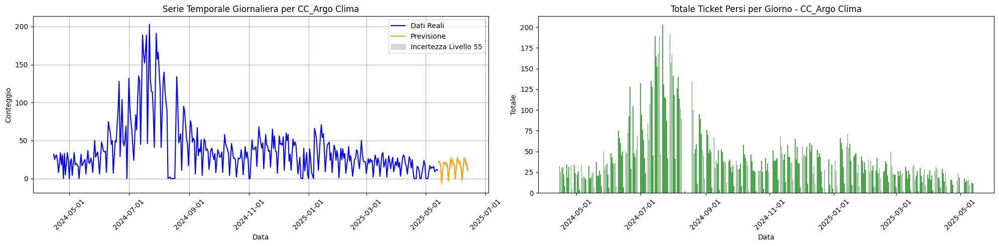

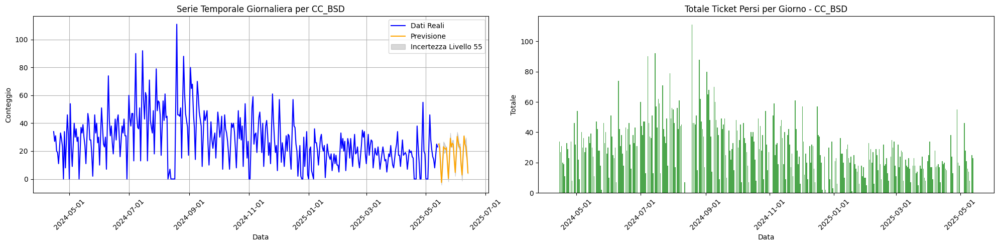

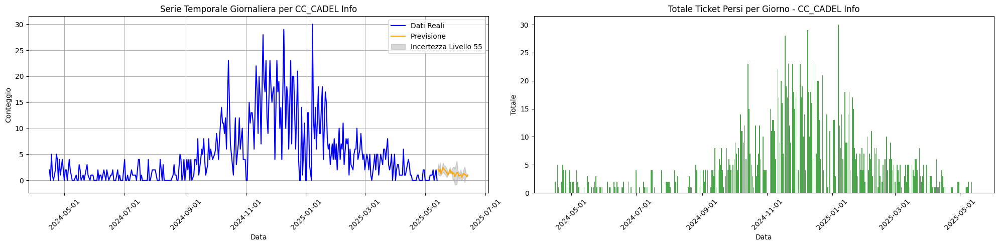

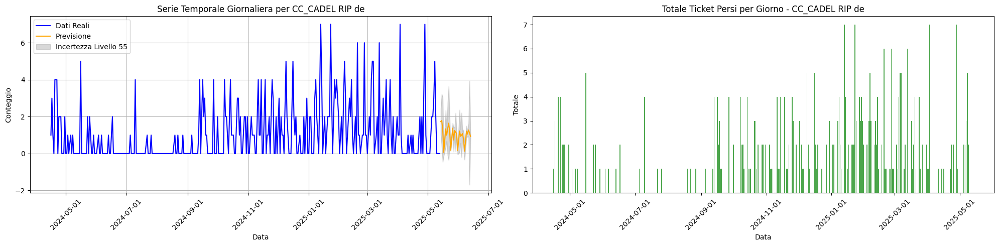

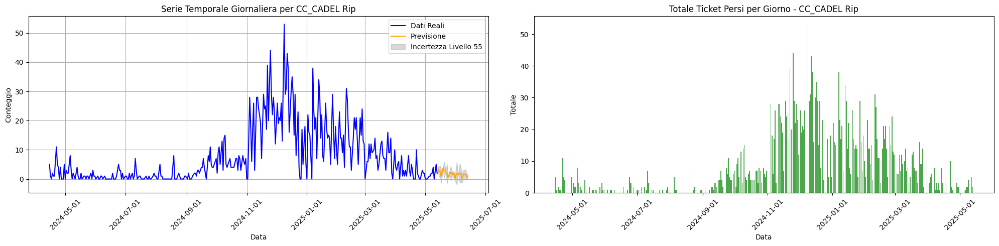

...

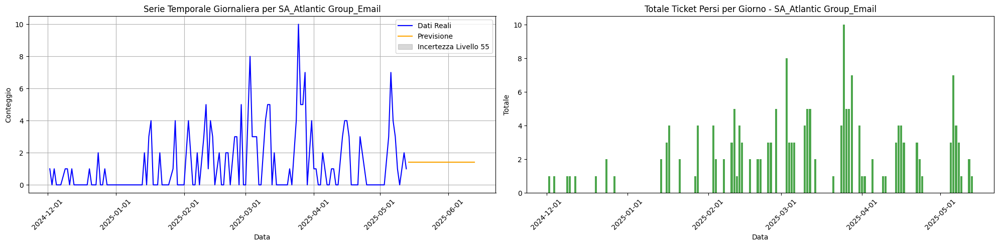

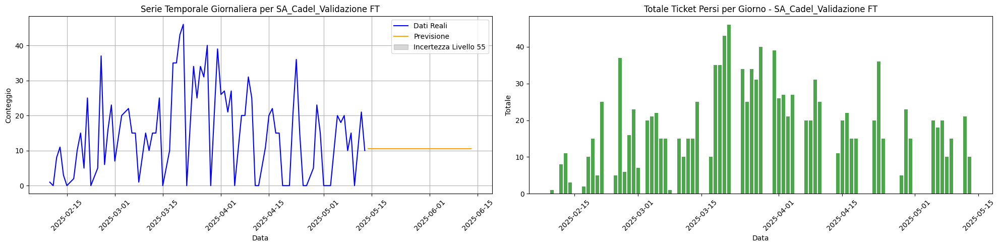

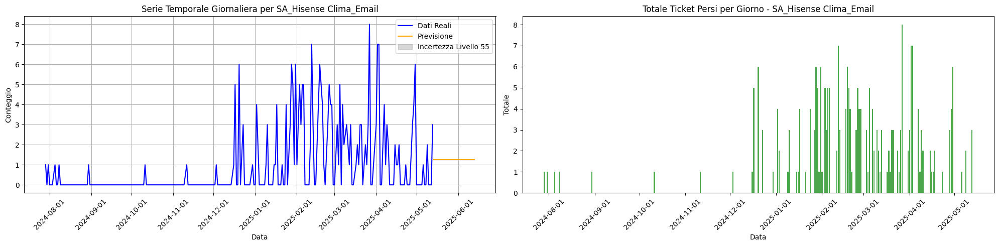

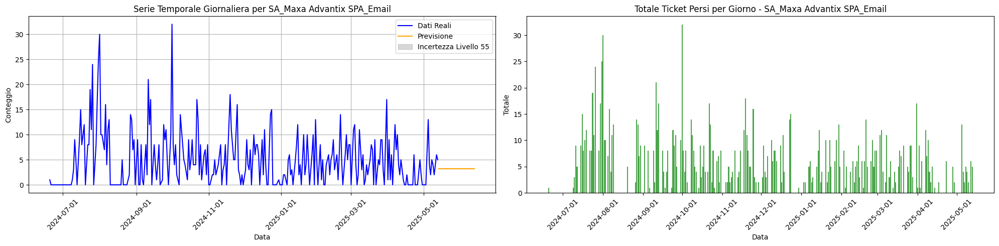

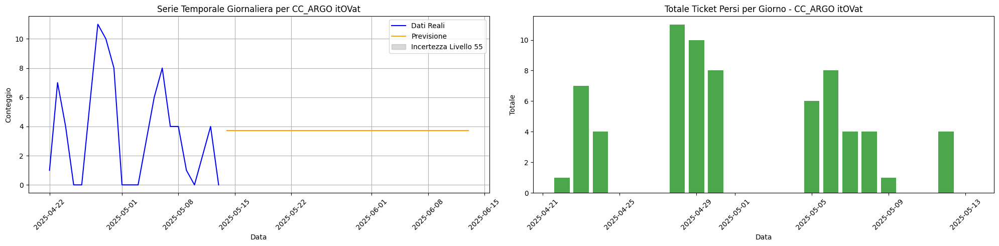

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Se non lo fossero già, convertiamo la colonna 'ds' in datetime
daily_df_transformed['ds'] = pd.to_datetime(daily_df_transformed['ds'])
daily_forecast['ds'] = pd.to_datetime(daily_forecast['ds'])

# Otteniamo la lista degli unique_id presenti nella previsione giornaliera
unique_ids_daily = daily_forecast['unique_id'].unique()

for unique_id in unique_ids_daily:
    # Dati reali per l'unico unique_id
    actual_data = daily_df_transformed[daily_df_transformed['unique_id'] == unique_id][['ds', 'count']]
    # Dati di previsione per l'unico unique_id
    forecast_data = daily_forecast[daily_forecast['unique_id'] == unique_id][['ds', 'TimeGPT', 'TimeGPT-lo-55', 'TimeGPT-hi-55']]

    if actual_data.empty:
        print(f"Nessun dato reale disponibile per unique_id: {unique_id}.")
        continue

    # Calcoliamo i totali giornalieri dai dati reali.
    # (Generalmente in una previsione giornaliera ci si aspetta un solo dato per giorno,
    # ma in caso ci fossero più record per lo stesso giorno li sommiamo.)
    daily_totals = actual_data.groupby(actual_data['ds'].dt.date)['count'].sum().reset_index()
    daily_totals['ds'] = pd.to_datetime(daily_totals['ds'])

    # Creiamo una figura con due subplot affiancati
    fig, ax = plt.subplots(1, 2, figsize=(20, 5))

    # SUBPLOT SINISTRA: Serie Temporale (dati reali e previsione)
    ax[0].plot(actual_data['ds'], actual_data['count'], label='Dati Reali', color='blue')
    ax[0].plot(forecast_data['ds'], forecast_data['TimeGPT'], label='Previsione', color='orange')
    ax[0].fill_between(forecast_data['ds'],
                       forecast_data['TimeGPT-lo-55'],
                       forecast_data['TimeGPT-hi-55'],
                       color='gray', alpha=0.3, label='Incertezza Livello 55')
    ax[0].set_title(f'Serie Temporale Giornaliera per {unique_id}')
    ax[0].set_xlabel('Data')
    ax[0].set_ylabel('Conteggio')
    ax[0].legend()
    ax[0].grid(True)
    ax[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[0].xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=45)

    # SUBPLOT DESTRA: Grafico a barre con il totale dei ticket persi per giorno
    ax[1].bar(daily_totals['ds'], daily_totals['count'], color='green', alpha=0.7)
    ax[1].set_title(f'Totale Ticket Persi per Giorno - {unique_id}')
    ax[1].set_xlabel('Data')
    ax[1].set_ylabel('Totale')
    ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[1].xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.setp(ax[1].xaxis.get_majorticklabels(), rotation=45)

    plt.tight_layout()
    plt.show()


# Preparazione ambiente simulazione

##Tabella operatori con abilitazione singola al servizio

In [ ]:
import pandas as pd
import numpy as np
import json

# ------------------------------------------------------
# Step 1: Carica i dati di presenza degli operatori da Google Sheets senza autenticazione (foglio 1, come da codice originario)
# ------------------------------------------------------

# Sostituisci con il tuo ID del Google Sheet
sheet_id_primo = '1JZOLzvDfzV8D1ESganNv4HCk7oRwr71tKBljsGnG89s'
sheet_name_primo = 'Tabella_personale'  # Sostituisci con il nome del tuo sheet se necessario

# Costruisci l'URL per leggere il primo sheet come CSV
url_primo = f'https://docs.google.com/spreadsheets/d/{sheet_id_primo}/export?format=csv&gid=0'

# Leggi il primo sheet in un DataFrame pandas
data = pd.read_csv(url_primo)

# ------------------------------------------------------
# Step 2: Carica i dati di abilitazione operatori/servizi da un secondo file Google Sheets
# (https://docs.google.com/spreadsheets/d/1GYkdMXM7kGPhaqk94SfgQtj-sxdtfgQch_cuoFz4tOY/edit?gid=0#gid=0)
# ------------------------------------------------------

#sheet_id_secondo = '1GYkdMXM7kGPhaqk94SfgQtj-sxdtfgQch_cuoFz4tOY'
sheet_id_secondo = '1syVTdkxw3tPk4VZZ1AtcGjsisLvQHca-yOCk3hKxMEI'   #utilizzo nuovo file "Matrice_abilitazione_utenti_OV_less"
url_secondo = f'https://docs.google.com/spreadsheets/d/{sheet_id_secondo}/export?format=csv&gid=0'

# Leggi il secondo sheet in un DataFrame pandas
data_service = pd.read_csv(url_secondo)

# ------------------------------------------------------
# Step 2a: Prepara la mappatura operatori->lista dei servizi abilitati
# ------------------------------------------------------

# Estraggo la colonna 'unique_id' (es. "CC_Argo Clima", "CC_Atlantic Group", etc.)
unique_id_col = data_service.columns[0]  # In genere 'unique_id'
unique_ids_service_sheet = data_service[unique_id_col].tolist()

# Le altre colonne sono i nomi degli operatori
operator_columns = data_service.columns[1:].tolist()

# Creiamo un dictionary in cui la chiave è il nome operatore, e il valore è la lista dei servizi abilitati.
operator_service_map = {}
for operator_name in operator_columns:
    # Selezioniamo tutte le righe dove quell'operatore ha 1
    # E otteniamo l'elenco dei unique_id corrispondenti
    abilitati = data_service.loc[data_service[operator_name] == 1, unique_id_col].tolist()
    operator_service_map[operator_name] = abilitati

# ------------------------------------------------------
# Step 3: Processa i dati della prima tabella per ottenere operator_id, assignment, etc.
# ------------------------------------------------------

# Converti le colonne 'DATA' e 'ORA' a stringa
data['DATA'] = data['DATA'].astype(str)
data['ORA'] = data['ORA'].astype(str)

# Combina 'DATA' e 'ORA' nella colonna 'DateTime'
data['DateTime'] = data['DATA'] + ' ' + data['ORA']

# Funzione di parsing custom per le date
def parse_datetime(row):
    if row['ORA'] == '00:00':
        return pd.to_datetime(row['DateTime'], format='%d/%m/%Y %H:%M', errors='coerce')
    else:
        # Per intervalli di tempo come '09:00-09:30', prendi l'ora di inizio
        start_time = row['ORA'].split('-')[0].replace('.', ':')
        datetime_str = f"{row['DATA']} {start_time}"
        return pd.to_datetime(datetime_str, format='%d/%m/%Y %H:%M', errors='coerce')

data['ds'] = data.apply(parse_datetime, axis=1)

# Elimina le righe dove 'ds' è NaT (parsing datetime fallito)
data = data.dropna(subset=['ds'])

# Elimina colonne non necessarie
data = data.drop(columns=['DATA', 'ORA', 'DateTime', 'TOTALE', 'KeySearch'], errors='ignore')

# Trasforma il DataFrame per avere una riga per operatore per fascia oraria
data_melted = data.melt(id_vars=['ds'], var_name='operator_name', value_name='availability')

def map_assignment(value):
    """
    Mappa '1' -> 'CC', 'SA' -> 'SA', NaN/altro -> np.nan
    """
    if str(value) == '1' or value == 1:
        return 'CC'
    elif str(value).strip().upper() == 'SA':
        return 'SA'
    else:
        return np.nan

data_melted['assignment'] = data_melted['availability'].apply(map_assignment)
data_melted = data_melted.dropna(subset=['assignment'])

# Assegna un operator_id unico a ogni operator_name
operator_names = data_melted['operator_name'].unique()
operator_ids = {name: idx + 1 for idx, name in enumerate(operator_names)}
data_melted['operator_id'] = data_melted['operator_name'].map(operator_ids)

# ------------------------------------------------------
# Step 4: Genera il file JSON con l'abilitazione operatori->servizi
# ------------------------------------------------------

# Costruiamo una struttura che, per ogni operatore, contenga:
#   {
#       "operator_id": <int>,
#       "operator_name": <str>,
#       "services": [ lista dei unique_id abilitati ]
#   }
operator_json_list = []
for op_name, op_id in operator_ids.items():
    services_enabled = operator_service_map.get(op_name, [])  # se l'operatore non esiste nella mappa, restituisco lista vuota
    operator_json_list.append({
        "operator_id": op_id,
        "operator_name": op_name,
        "services": services_enabled
    })

# Salviamo in un file JSON
with open('operator_services.json', 'w', encoding='utf-8') as f:
    json.dump(operator_json_list, f, ensure_ascii=False, indent=4)

# ------------------------------------------------------
# Step 5: Genera le matrici operatori per ogni unique_id
# ------------------------------------------------------

# Carico (o genero) un DataFrame 'combined_hourly_forecasts' con la colonna 'unique_id'
combined_hourly_forecasts = pd.read_csv('combined_daily_forecasts.csv')
try:
    all_unique_ids = combined_hourly_forecasts['unique_id'].unique()
except KeyError:
    print("Attenzione: la colonna 'unique_id' non esiste in combined_hourly_forecasts.")
    all_unique_ids = []

operator_matrices = {}

# Creiamo un dizionario di appoggio: { op_id: set([servizi]) } per controllo rapido
#  su quali unique_id un operatore è abilitato.
#  Lo costruiamo dal file JSON appena creato o direttamente da 'operator_json_list'.
op_id_service_map = {}
for entry in operator_json_list:
    op_id_service_map[entry['operator_id']] = set(entry['services'])

for unique_id in all_unique_ids:
    # Determina il tipo di assegnazione in base all'unique_id (CC_ o SA_)
    if unique_id.startswith('CC_'):
        assignment_type = 'CC'
    elif unique_id.startswith('SA_'):
        assignment_type = 'SA'
    else:
        # Se il servizio non inizia con CC_ o SA_, skip (o gestisci in altro modo)
        continue

    # Filtra data_melted per il tipo di assegnazione
    matrix = data_melted[data_melted['assignment'] == assignment_type].copy()

    # Arrotonda le fasce orarie all'ora più vicina
    matrix['ds'] = matrix['ds'].dt.floor('h')

    # Rimuovi duplicati
    matrix = matrix.drop_duplicates(subset=['ds', 'operator_id'])

    # Ora verifichiamo se l'operatore è abilitato a questo servizio
    # Tenendo conto di op_id_service_map
    def check_availability(op_id):
        """Ritorna 1 se op_id è abilitato a unique_id, altrimenti 0."""
        if unique_id in op_id_service_map[op_id]:
            return 1
        else:
            return 0

    matrix['availability'] = matrix['operator_id'].apply(check_availability)

    # Mantieni solo righe con availability = 1
    matrix = matrix[matrix['availability'] == 1]

    # Mantieni solo le colonne ['ds', 'operator_id', 'availability']
    matrix = matrix[['ds', 'operator_id', 'availability']]

    operator_matrices[unique_id] = matrix

# ------------------------------------------------------
# Step 6: Salva le matrici operatori in file CSV nella cartella "operator_matrices"
# ------------------------------------------------------

# Crea la cartella "operator_matrices" se non esiste
os.makedirs("operator_matrices", exist_ok=True)

for unique_id, matrix in operator_matrices.items():
    # Costruisci il percorso completo del file
    filepath = os.path.join("operator_matrices", f'operator_matrix_{unique_id}.csv')
    matrix.to_csv(filepath, index=False)

print("Le matrici operatori sono state generate e salvate nei file CSV nella cartella 'operator_matrices'.")
print("File JSON con i servizi abilitati per operatore salvato come 'operator_services.json'.")


<ipython-input-5-be4479958bb6>:173: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matrix['availability'] = matrix['operator_id'].apply(check_availability)
<ipython-input-5-be4479958bb6>:173: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matrix['availability'] = matrix['operator_id'].apply(check_availability)


Le matrici operatori sono state generate e salvate nei file CSV nella cartella 'operator_matrices'.
File JSON con i servizi abilitati per operatore salvato come 'operator_services.json'.


## Genezione di due file di configurazione dove vengono calcolati i tempi di gestione medi e i tempi di risposta massimi accettabili per ciascun servizio.

In [ ]:
import json

# -------------------------
# Step 1: Load the Data from Input Files
# -------------------------

# Read 'scarico_annuale_CC' and 'scarico_annuale_SA' assuming they are CSV files with ';' as separator
df_cc = pd.read_csv('scarico_annuale_CC.csv', parse_dates=['data inizio'])
df_sa = pd.read_csv('scarico_annuale_SA.csv', parse_dates=['data inizio'])

# Combine the two DataFrames
df = pd.concat([df_cc, df_sa], ignore_index=True)

# -------------------------
# Step 2: Process 'rispostacc' to Set 'unique_id' as 'rispostacc' (including 'CC_' and 'SA_')
# -------------------------

# Retain the full 'rispostacc' as 'unique_id', including 'CC_' and 'SA_' prefixes
df['unique_id'] = df['rispostacc'].str.strip()

# -------------------------
# Step 3: Clean and Prepare the Data
# -------------------------

# Convert 'durata' to numeric, coerce errors to NaN
df['durata'] = pd.to_numeric(df['durata'], errors='coerce')

# Remove rows with missing 'durata' or 'unique_id'
df = df.dropna(subset=['durata', 'unique_id'])

# Filter out rows where 'durata' is <= 0
df = df[df['durata'] > 0]

# Optionally, filter by 'descrtipochiamata' if needed
# Include only relevant call types
#valid_call_types = ['Incoming Answered', 'Richiamo differito', 'Email']
#df = df[df['descrtipochiamata'].isin(valid_call_types)]

# -------------------------
# Step 4: Calculate Average Duration and Max Wait Time per 'unique_id'
# -------------------------

# Group by 'unique_id' and calculate average (by median since irregular distribution) 'durata' and 90th percentile
average_durations = df.groupby('unique_id')['durata'].median()
max_wait_times = df.groupby('unique_id')['durata'].quantile(0.9)

average_durations_dict = average_durations.to_dict()
max_wait_times_dict = max_wait_times.to_dict()

# -------------------------
# Step 5: Prepare the Configurations
# -------------------------

# Assume 'combined_hourly_forecasts' is already loaded with 'unique_id' column
# Ensure that 'combined_hourly_forecasts' is defined before running this script
# Example:
# combined_hourly_forecasts = pd.read_csv('combined_hourly_forecasts.csv', parse_dates=['ds'])

unique_ids = combined_hourly_forecasts['unique_id'].unique()

# Initialize the configurations
tempo_risposta_medio_config = {}
tempo_attesa_massimo_config = {}

# Build 'tempo_risposta_medio_config' and 'tempo_attesa_massimo_config'
for unique_id in unique_ids:
    # Average duration
    if unique_id in average_durations_dict:
        avg_duration = average_durations_dict[unique_id]
        tempo_risposta_medio_config[unique_id] = int(round(avg_duration))
    else:
        # Default value if data is not available
        tempo_risposta_medio_config[unique_id] = 400  # Default value in seconds

    # Max wait time (90th percentile)
    if unique_id in max_wait_times_dict:
        max_wait_time = max_wait_times_dict[unique_id]
        tempo_attesa_massimo_config[unique_id] = int(round(max_wait_time))
    else:
        # Default value if data is not available
        tempo_attesa_massimo_config[unique_id] = 360  # Default value in seconds

# -------------------------
# Step 6: Save the Configurations to JSON Files
# -------------------------

with open('tempo_risposta_medio_config.json', 'w') as f:
    json.dump(tempo_risposta_medio_config, f, indent=4)

with open('tempo_attesa_massimo_config.json', 'w') as f:
    json.dump(tempo_attesa_massimo_config, f, indent=4)

print("Configuration files generated successfully.")


Configuration files generated successfully.


## Estensione della previsione giornaliera in fasce orarie

In [ ]:
import pandas as pd
import numpy as np

# -------------------------
# Step 1: Caricare il File delle Previsioni Giornaliere
# -------------------------

# Caricare le previsioni giornaliere
daily_forecasts = pd.read_csv('/content/combined_daily_forecasts.csv', parse_dates=['ds'])

# Verificare le colonne presenti
print("Colonne nel file delle previsioni giornaliere:", daily_forecasts.columns.tolist())

# -------------------------
# Step 2: Definire il Profilo Orario (hourly_profile)
# -------------------------

hourly_profile = {
    0: 0.0,
    1: 0.0,
    2: 0.0,
    3: 0.0,
    4: 0.0,
    5: 0.0,
    6: 0.0,
    7: 0.0015,
    8: 0.0470,
    9: 0.1156,
    10: 0.1379,
    11: 0.1277,
    12: 0.0997,
    13: 0.0618,
    14: 0.0815,
    15: 0.0925,
    16: 0.0990,
    17: 0.0777,
    18: 0.0432,
    19: 0.0144,
    20: 0.0004,
    21: 0.0,
    22: 0.0,
    23: 0.0
}

# Verificare che le proporzioni sommino a 1
total_proportion = sum(hourly_profile.values())
print(f"Somma delle proporzioni orarie: {total_proportion}")

# Normalizzare il profilo orario se necessario
if not np.isclose(total_proportion, 1.0):
    hourly_profile = {k: v / total_proportion for k, v in hourly_profile.items()}
    print("Profilo orario normalizzato.")

# -------------------------
# Step 2.1: Impostare i Valori Negativi a Zero Prima della Distribuzione
# -------------------------

forecast_columns = ['TimeGPT', 'TimeGPT-hi-55', 'TimeGPT-lo-55']

# Sostituire i valori negativi con zero nel DataFrame delle previsioni giornaliere
for col in forecast_columns:
    daily_forecasts[col] = daily_forecasts[col].apply(lambda x: x if x >= 0 else 0.0)

# -------------------------
# Step 3: Calcolare le Somme Totali Giornalieri Dopo Aver Corretto i Valori Negativi
# -------------------------

# Verifica: calcolare la somma totale dei ticket per ogni giorno e livello di previsione prima della distribuzione
daily_sums = daily_forecasts.groupby('ds')[forecast_columns].sum().reset_index()
print("\nSomma totale dei ticket giornalieri per ogni giorno e livello di previsione (prima della distribuzione):")
print(daily_sums)

# -------------------------
# Step 4: Espandere le Previsioni Giornaliere in Orarie
# -------------------------

# Creare un DataFrame vuoto per le previsioni orarie
hourly_forecasts_list = []

# Iterare su ogni riga del DataFrame delle previsioni giornaliere
for idx, row in daily_forecasts.iterrows():
    unique_id = row['unique_id']
    date = row['ds']

    # Ottenere i valori per ogni livello di previsione
    daily_counts = {}
    for col in forecast_columns:
        value = row[col]
        # I valori negativi sono già stati impostati a zero
        daily_counts[col] = value

    # Calcolare i ticket orari per ogni livello di previsione
    for hour in range(24):
        proportion = hourly_profile.get(hour, 0.0)
        hourly_counts = {}
        for col in forecast_columns:
            hourly_counts[col] = daily_counts[col] * proportion

        # Creare il timestamp per l'ora corrente
        timestamp = pd.Timestamp(year=date.year, month=date.month, day=date.day, hour=hour)

        # Creare il dizionario per questa riga
        row_dict = {'unique_id': unique_id, 'ds': timestamp}
        for col in forecast_columns:
            row_dict[col] = hourly_counts[col]

        # Aggiungere la riga alla lista
        hourly_forecasts_list.append(row_dict)

# Convertire la lista in un DataFrame
hourly_forecasts = pd.DataFrame(hourly_forecasts_list)

# -------------------------
# Verifica: calcolare la somma totale dei ticket per ogni giorno e livello di previsione dopo la distribuzione
# -------------------------

# Convertire 'ds' in datetime se non lo è già
hourly_forecasts['ds'] = pd.to_datetime(hourly_forecasts['ds'])

# Creare una colonna 'date' di tipo datetime64[ns] per l'aggregazione
hourly_forecasts['date'] = hourly_forecasts['ds'].dt.floor('D')

# Calcolare le somme orarie per ogni giorno e livello di previsione
hourly_sums = hourly_forecasts.groupby('date')[forecast_columns].sum().reset_index()
print("\nSomma totale dei ticket giornalieri per ogni giorno e livello di previsione (dopo la distribuzione):")
print(hourly_sums)

# -------------------------
# Confrontare le somme prima e dopo la distribuzione
# -------------------------

print("\nConfronto delle somme prima e dopo la distribuzione:")
comparison = pd.merge(daily_sums, hourly_sums, left_on='ds', right_on='date', suffixes=('_daily', '_hourly'))
for col in forecast_columns:
    comparison[f'diff_{col}'] = comparison[f'{col}_daily'] - comparison[f'{col}_hourly']

print(comparison[['ds'] + [f'diff_{col}' for col in forecast_columns]])

# Verificare che le differenze siano minime
print("\nVerifica delle differenze (dovrebbero essere vicine a zero):")
for col in forecast_columns:
    max_diff = comparison[f'diff_{col}'].abs().max()
    print(f"Massima differenza per {col}: {max_diff}")

# -------------------------
# Step 5: Salvare il Nuovo DataFrame in un File CSV
# -------------------------

# Rimuovere la colonna 'date' (se non necessaria)
hourly_forecasts = hourly_forecasts.drop(columns=['date'])

# Ordinare il DataFrame
hourly_forecasts = hourly_forecasts.sort_values(['unique_id', 'ds']).reset_index(drop=True)

# Controllare le colonne e il formato
print("\nColonne nel file delle previsioni orarie:", hourly_forecasts.columns.tolist())

# Salvare il DataFrame in un file CSV
hourly_forecasts.to_csv('/content/hourly_projection_forecasts.csv', index=False)

print("\nNuovo file '/content/hourly_projection_forecasts.csv' creato con successo.")

Colonne nel file delle previsioni giornaliere: ['unique_id', 'ds', 'TimeGPT', 'TimeGPT-hi-55', 'TimeGPT-lo-55']
Somma delle proporzioni orarie: 0.9998999999999999
Profilo orario normalizzato.

Somma totale dei ticket giornalieri per ogni giorno e livello di previsione (prima della distribuzione):
           ds     TimeGPT  TimeGPT-hi-55  TimeGPT-lo-55
0  2025-05-14  595.027849     731.367493     465.452880
1  2025-05-15  563.244267     668.956022     458.043005
2  2025-05-16  433.396514     524.216790     345.857863
3  2025-05-17  136.822337     180.232742     105.031619
4  2025-05-19  599.606283     708.869829     492.892900
5  2025-05-20  565.351830     704.823451     432.735223
6  2025-05-21  554.459963     675.844082     437.692197
7  2025-05-22  550.374814     631.373508     474.779879
8  2025-05-23  408.513975     523.229292     304.523830
9  2025-05-24  125.832625     169.631079      91.241083
10 2025-05-26  635.984259     724.061056     551.483006
11 2025-05-27  562.079469     

#simulazione di Montecarlo CC

nota: TimeGPT-hi-55 in uso

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

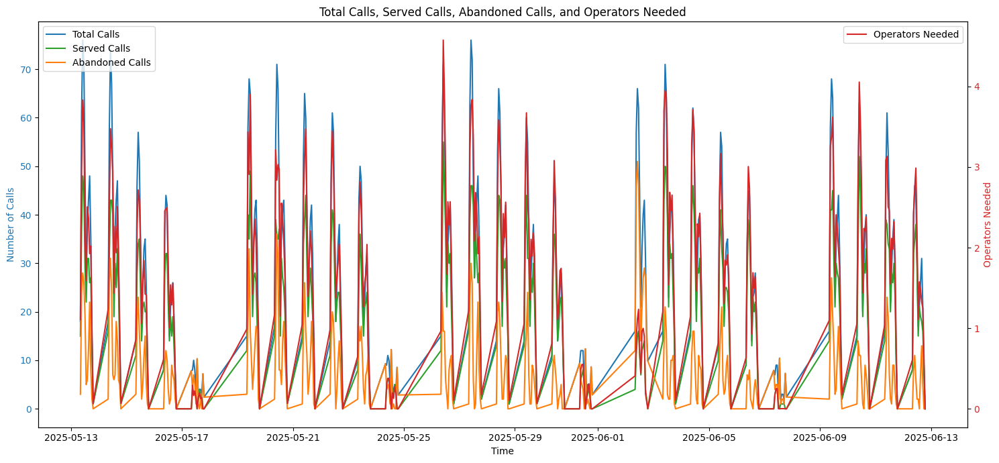

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Simulazione completata.
File dei risultati salvati e scaricati con successo.
File 'operator_busy_per_service.csv' creato con dettaglio per servizio (se non vuoto).
File 'operator_busy_total.csv' creato con la colonna busy_seconds totale (se non vuoto).


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import files
from scipy.stats import weibull_min
import json
import os

# Per le frequenze custom (lun-sab, 08:00-20:00)
from pandas.tseries.offsets import CustomBusinessDay, CustomBusinessHour

# Frequenze custom
cbd = CustomBusinessDay(weekmask='Mon Tue Wed Thu Fri Sat')
cbh = CustomBusinessHour(start='08:00', end='20:00', weekmask='Mon Tue Wed Thu Fri Sat')

def simulate_call_center(
    calls_per_service,
    mu_dict,
    shape,
    scale_dict,
    max_waiting_time_dict,
    all_operator_matrix,
    datetime,
    operator_busy_records
):
    """
    Esegue la simulazione Montecarlo per una singola fascia oraria (datetime)
    e restituisce un dizionario {service: (served_calls, abandoned_calls)}.

    Oltre a ciò, traccia per ogni operatore il tempo totale di servizio
    su questa fascia oraria, accumulandolo in operator_busy_records,
    e specifica a quale servizio (unique_id) è dedicato quel tempo.
    """

    total_calls = sum(calls_per_service.values())
    if total_calls == 0:
        return {service: (0, 0) for service in calls_per_service}

    # Filtra gli operatori disponibili in questa fascia oraria
    available_operators_df = all_operator_matrix[
        (all_operator_matrix['ds'] == datetime) &
        (all_operator_matrix['availability'] == 1)
    ]

    # Dizionario operator_id -> lista di unique_id (servizi) che l’operatore può gestire
    operator_services = available_operators_df.groupby('operator_id')['unique_id'].apply(list).to_dict()

    # Inizializza i tempi "free" degli operatori
    operator_free_times = {op_id: 0.0 for op_id in operator_services.keys()}

    # Se non ci sono operatori, tutte le chiamate abbandonate
    if len(operator_free_times) == 0:
        return {service: (0, calls_per_service[service]) for service in calls_per_service}

    # results[service] = [served_calls, abandoned_calls]
    results = {service: [0, 0] for service in calls_per_service}

    # Crea la lista di chiamate
    all_calls = []
    for service, calls in calls_per_service.items():
        for i in range(int(calls)):
            all_calls.append((service, i))

    np.random.shuffle(all_calls)

    # Genera i tempi di abbandono (Weibull)
    abandonment_times = {}
    for service, calls in calls_per_service.items():
        num_calls = int(calls)
        if num_calls > 0:
            abandonment_times[service] = weibull_min.rvs(shape, scale=scale_dict[service], size=num_calls)
        else:
            abandonment_times[service] = np.array([])

    # Processa ciascuna chiamata
    for service, call_index in all_calls:
        arrival_time = np.random.uniform(0, 3600)
        service_time = np.random.exponential(1 / mu_dict[service])

        # Operatori abilitati al servizio
        available_ops = [op_id for op_id, services in operator_services.items() if service in services]
        if not available_ops:
            # Nessun operatore abilitato
            results[service][1] += 1
            continue

        # Trova l'operatore che si libera prima
        min_free_time = min(operator_free_times[op] for op in available_ops)
        waiting_time = max(0.0, min_free_time - arrival_time)

        # Confronta con abbandono
        if waiting_time > abandonment_times[service][call_index]:
            # Abbandono
            results[service][1] += 1
        else:
            # Servito
            results[service][0] += 1
            chosen_operator = min(available_ops, key=lambda op: operator_free_times[op])
            operator_free_times[chosen_operator] = max(
                operator_free_times[chosen_operator],
                arrival_time
            ) + service_time

            # Tracciamo il tempo su quell'operatore e servizio
            operator_busy_records.append({
                'ds': datetime,
                'operator_id': chosen_operator,
                'unique_id': service,
                'service_time': service_time
            })

    return {service: tuple(result) for service, result in results.items()}


# -------------------------------------------------------------------
# Caricamento del file 'hourly_projection_forecasts.csv'
# -------------------------------------------------------------------
if not os.path.exists('/content/hourly_projection_forecasts.csv'):
    raise FileNotFoundError(
        "Il file 'hourly_projection_forecasts.csv' non è stato trovato."
    )

timegpt_fcst_with_history_df = pd.read_csv('/content/hourly_projection_forecasts.csv', parse_dates=['ds'])

# -------------------------------------------------------------------
# Caricamento matrici operatore + filtraggio DataFrame vuoti
# -------------------------------------------------------------------
operator_matrices = {}
unique_ids_list = timegpt_fcst_with_history_df['unique_id'].unique()

for unique_id in unique_ids_list:
    try:
        df_matrix = pd.read_csv(
            f'/content/operator_matrices/operator_matrix_{unique_id}.csv',
            parse_dates=['ds']
        )
        df_matrix['unique_id'] = unique_id
        operator_matrices[unique_id] = df_matrix
    except FileNotFoundError:
        print(f"Operator matrix for unique_id {unique_id} not found.")
        continue

# Qui filtriamo i DF non vuoti prima di concatenare
non_empty_dfs = [df for df in operator_matrices.values() if not df.empty]

if non_empty_dfs:
    all_operator_matrix = pd.concat(non_empty_dfs, ignore_index=True)
else:
    all_operator_matrix = pd.DataFrame(columns=['ds', 'operator_id', 'availability', 'unique_id'])

# -------------------------------------------------------------------
# Caricamento config (tempo_risposta_medio, tempo_attesa_massimo)
# -------------------------------------------------------------------
try:
    with open('tempo_risposta_medio_config.json', 'r') as f:
        tempo_risposta_medio_config = json.load(f)
except FileNotFoundError:
    print("Config 'tempo_risposta_medio_config.json' non trovata.")
    tempo_risposta_medio_config = {}

try:
    with open('tempo_attesa_massimo_config.json', 'r') as f:
        tempo_attesa_massimo_config = json.load(f)
except FileNotFoundError:
    print("Config 'tempo_attesa_massimo_config.json' non trovata.")
    tempo_attesa_massimo_config = {}

mu_dict = {}
for unique_id in unique_ids_list:
    avg_sec = tempo_risposta_medio_config.get(unique_id, 300)
    mu_dict[unique_id] = 1 / avg_sec

shape = 2
scale_dict = {}
for unique_id in unique_ids_list:
    max_wait_sec = tempo_attesa_massimo_config.get(unique_id, 300)
    scale_dict[unique_id] = max_wait_sec / np.log(2)

# -------------------------------------------------------------------
# Creazione delle date/ore su cui simulare (lun-sab, 08-20)
# -------------------------------------------------------------------
min_date = timegpt_fcst_with_history_df['ds'].min().floor('D')
max_date = timegpt_fcst_with_history_df['ds'].max().ceil('D')

simulation_dates = pd.date_range(start=min_date, end=max_date, freq=cbh)
simulation_dates = simulation_dates[
    (simulation_dates >= timegpt_fcst_with_history_df['ds'].min()) &
    (simulation_dates <= timegpt_fcst_with_history_df['ds'].max())
]

# -------------------------------------------------------------------
# Dizionario per accesso veloce ai forecast
# -------------------------------------------------------------------
fcst_dict = {}
grouped_fcst = timegpt_fcst_with_history_df.groupby('ds')
for dt, group in grouped_fcst:
    calls_per_service = dict(zip(group['unique_id'], group['TimeGPT-hi-55']))
    fcst_dict[dt] = calls_per_service

# -------------------------------------------------------------------
# Lista record occupazione operatore e lost_records
# -------------------------------------------------------------------
operator_busy_records = []
results_all = {unique_id: [] for unique_id in unique_ids_list}
lost_records = []

# -------------------------------------------------------------------
# Loop principale di simulazione
# -------------------------------------------------------------------
for dt in simulation_dates:
    if dt in fcst_dict:
        base_calls_dict = fcst_dict[dt]
    else:
        base_calls_dict = {}

    calls_per_service = {}
    for unique_id in unique_ids_list:
        calls_per_service[unique_id] = max(0, float(base_calls_dict.get(unique_id, 0.0)))

    simulation_results = simulate_call_center(
        calls_per_service,
        mu_dict,
        shape,
        scale_dict,
        tempo_attesa_massimo_config,
        all_operator_matrix,
        dt,
        operator_busy_records
    )

    # Salva i risultati
    for unique_id in unique_ids_list:
        served_calls, abandoned_calls = simulation_results.get(unique_id, (0, 0))
        total_calls = served_calls + abandoned_calls
        avg_service_time = 1 / mu_dict[unique_id]
        total_busy_time = served_calls * avg_service_time
        operators_needed = total_busy_time / 3600.0

        results_all[unique_id].append({
            'ds': dt,
            'TimeGPT-hi-55': total_calls,
            'served_calls': served_calls,
            'abandoned_calls': abandoned_calls,
            'operators_needed': operators_needed
        })

        lost_records.append({
            'ds': dt,
            'unique_id': unique_id,
            'lost_calls': abandoned_calls
        })

# -------------------------------------------------------------------
# Post-process: costruiamo operator_busy_df e pivot
# -------------------------------------------------------------------
operator_busy_df = pd.DataFrame(operator_busy_records)
# Abbiamo: ['ds', 'operator_id', 'unique_id', 'service_time']

# Se vogliamo la pivot "operator_busy_per_service.csv"
if not operator_busy_df.empty:
    # Creiamo la pivot DIRECTLY su operator_busy_df:
    pivot_services = operator_busy_df.pivot_table(
        index=['ds','operator_id'],
        columns='unique_id',
        values='service_time',
        aggfunc='sum',
        fill_value=0
    )
    pivot_services['total_busy_seconds'] = pivot_services.sum(axis=1)
    pivot_services = pivot_services.reset_index()

    pivot_services.to_csv('operator_busy_per_service.csv', index=False)
    files.download('operator_busy_per_service.csv')
else:
    print("Nessun record in operator_busy_records, skip 'operator_busy_per_service.csv'")

# Se vogliamo anche un file con la colonna total "busy_seconds" (senza dettagli)
if not operator_busy_df.empty:
    grouped_total = operator_busy_df.groupby(['ds','operator_id'], as_index=False)['service_time'].sum()
    grouped_total = grouped_total.rename(columns={'service_time': 'busy_seconds'})
    grouped_total.to_csv('operator_busy_total.csv', index=False)
    files.download('operator_busy_total.csv')

# -------------------------------------------------------------------
# Convertiamo i risultati per ogni servizio in DataFrame e salviamo
# -------------------------------------------------------------------
for unique_id in results_all:
    df_res = pd.DataFrame(results_all[unique_id])
    df_res.to_csv(f'simulation_results_{unique_id}.csv', index=False)
    #files.download(f'simulation_results_{unique_id}.csv')
    results_all[unique_id] = df_res

# -------------------------------------------------------------------
# Calcoliamo i totali globali (somma su tutti i unique_id)
# -------------------------------------------------------------------
total_calls = None
total_operators = None
total_abandoned = None
total_served = None

for df in results_all.values():
    if total_calls is None:
        total_calls = df[['ds', 'TimeGPT-hi-55']].set_index('ds')
        total_operators = df[['ds', 'operators_needed']].set_index('ds')
        total_abandoned = df[['ds', 'abandoned_calls']].set_index('ds')
        total_served = df[['ds', 'served_calls']].set_index('ds')
    else:
        total_calls = total_calls.add(df.set_index('ds')[['TimeGPT-hi-55']], fill_value=0)
        total_operators = total_operators.add(df.set_index('ds')[['operators_needed']], fill_value=0)
        total_abandoned = total_abandoned.add(df.set_index('ds')[['abandoned_calls']], fill_value=0)
        total_served = total_served.add(df.set_index('ds')[['served_calls']], fill_value=0)

# -------------------------------------------------------------------
# Plot globale (facoltativo)
# -------------------------------------------------------------------
fig, ax1 = plt.subplots(figsize=(15, 7))

ax1.set_xlabel('Time')
ax1.set_ylabel('Number of Calls', color='tab:blue')
ax2 = ax1.twinx()
ax2.set_ylabel('Operators Needed', color='tab:red')

ax1.plot(total_calls.index, total_calls['TimeGPT-hi-55'], color='tab:blue', label='Total Calls')
ax1.plot(total_served.index, total_served['served_calls'], color='tab:green', label='Served Calls')
ax1.plot(total_abandoned.index, total_abandoned['abandoned_calls'], color='tab:orange', label='Abandoned Calls')
ax2.plot(total_operators.index, total_operators['operators_needed'], color='tab:red', label='Operators Needed')

ax1.tick_params(axis='y', labelcolor='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:red')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Total Calls, Served Calls, Abandoned Calls, and Operators Needed')
fig.tight_layout()
plt.show()

# -------------------------------------------------------------------
# Salvataggio totali
# -------------------------------------------------------------------
total_results = pd.concat([
    total_calls,
    total_served,
    total_abandoned,
    total_operators
], axis=1)

total_results.to_csv('simulation_results_total.csv')
files.download('simulation_results_total.csv')

# -------------------------------------------------------------------
# Tabella dei ticket persi (lost_calls)
# -------------------------------------------------------------------
lost_df = pd.DataFrame(lost_records)
lost_pivot = lost_df.pivot(index='ds', columns='unique_id', values='lost_calls').fillna(0)
lost_pivot['total_lost'] = lost_pivot.sum(axis=1)
lost_pivot.to_csv('lost_table.csv')
#files.download('lost_table.csv')

print("Simulazione completata.")
print("File dei risultati salvati e scaricati con successo.")
print("File 'operator_busy_per_service.csv' creato con dettaglio per servizio (se non vuoto).")
print("File 'operator_busy_total.csv' creato con la colonna busy_seconds totale (se non vuoto).")


## heatmap Ticket persi totali

In [ ]:
# BLOCCO HEATMAP: ESEGUIRE MANUALMENTE IN COLAB DOPO LA SIMULAZIONE

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

def create_interactive_heatmap(lost_records):
    """
    Crea una heatmap interattiva con:
     - Asse x = ora
     - Asse y = giorno
     - Valori (colore) = numero di ticket persi totali per quell'ora
     - Testo dentro la cella = numero di ticket persi
     - Tooltip = lista dei servizi persi, con il relativo numero di ticket (ciascuno su una nuova riga)
    """

    # Assumiamo che lost_records sia una lista di dict con campi:
    #   ['ds', 'unique_id', 'lost_calls']
    # Esempio:
    #  [
    #    {'ds': Timestamp('2025-01-01 08:00:00'), 'unique_id': 'CC_Argo', 'lost_calls': 2},
    #    ...
    #  ]

    # 1) Creiamo un DataFrame
    df_lost = pd.DataFrame(lost_records).copy()

    # 2) Convertiamo 'ds' in due colonne: day (YYYY-MM-DD) e hour (HH:MM)
    df_lost['day'] = df_lost['ds'].dt.strftime('%Y-%m-%d')
    df_lost['hour'] = df_lost['ds'].dt.strftime('%H:%M')

    # 3) Raggruppiamo per (day, hour, unique_id) in caso di duplicati
    agg_df = df_lost.groupby(['day', 'hour', 'unique_id'], as_index=False)['lost_calls'].sum()

    # 4) Creiamo un DF con (day, hour) -> testo dettagliato, e somma totale
    def detail_formatter(subdf):
        """
        subdf contiene righe con unique_id, lost_calls per la stessa (day, hour).
        Ritorna:
          - detail_list: stringa multilinea con 'unique_id: lost_calls' su righe separate
          - lost_sum: somma di lost_calls
        """
        lines = []
        total = 0
        for _, row in subdf.iterrows():
            if row['lost_calls'] > 0:
                lines.append(f"{row['unique_id']}: {int(row['lost_calls'])}")
                total += row['lost_calls']
        if len(lines) == 0:
            lines = ["Nessun abbandono"]
        detail_list = "<br>".join(lines)  # per il tooltip multilinea
        return pd.Series({
            'services_lost_detail': detail_list,
            'lost_sum': total
        })

    grouped_detail = agg_df.groupby(['day', 'hour']).apply(detail_formatter).reset_index()
    # -> grouped_detail avrà: day, hour, services_lost_detail, lost_sum

    # 5) Creiamo la pivot (asse y=day, x=hour, valore=lost_sum)
    pivot_heatmap = grouped_detail.pivot(index='day', columns='hour', values='lost_sum').fillna(0)

    # 6) Creiamo un'altra pivot (stessa shape) con i tooltip multilinea
    pivot_tooltip = grouped_detail.pivot(index='day', columns='hour', values='services_lost_detail').fillna('')

    # Ricaviamo x_values, y_values, z_values
    x_values = list(pivot_heatmap.columns)
    y_values = list(pivot_heatmap.index)
    z_values = pivot_heatmap.values  # matrice
    z_text = z_values.astype(int).astype(str)  # verrà usata come testo nella cella

    # Con ztext useremo la pivot_tooltip
    custom_tooltip = pivot_tooltip.values

    # 7) Creiamo la heatmap con plotly.graph_objects
    #    - z -> intensità colore
    #    - text -> il valore mostrato nella cella
    #    - customdata -> i tooltip multilinea
    #    - texttemplate -> per stampare i valori in cella
    #    - hovertemplate -> per mostrare i tooltip

    heatmap = go.Heatmap(
        x=x_values,
        y=y_values,
        z=z_values,
        text=z_text,           # testo mostrato nella cella
        customdata=custom_tooltip,
        colorscale='Reds',
        hovertemplate=(
            "Giorno: %{y}<br>"
            "Ora: %{x}<br>"
            "Ticket Persi: %{z}<br>"
            "<br>%{customdata}<extra></extra>"
        ),
        # texttemplate sarà usato se abiliti "text" su heatmap
        # ma per avere testo al centro, usiamo "texttemplate"
        texttemplate="%{text}",  # mostriamo i ticket persi in cella
        textfont={"size":12},
        showscale=True
    )

    fig = go.Figure(data=[heatmap])
    fig.update_layout(
        title="Heatmap Ticket Persi (con Dettagli per Servizio)",
        xaxis=dict(title="Ora"),
        yaxis=dict(title="Giorno", autorange='reversed'),  # invertiamo l'ordine dei giorni
        width=1000,
        height=600
    )

    fig.show()


# ESEMPIO di utilizzo in Colab:
# 1) Hai finito la simulazione, e la lista 'lost_records' è popolata.
# 2) Esegui:
create_interactive_heatmap(lost_records)
#
# e otterrai la heatmap interattiva con i valori numerici nelle celle
# e, in tooltip, una lista multilinea dei servizi persi.


<ipython-input-9-79353a257a50>:57: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_detail = agg_df.groupby(['day', 'hour']).apply(detail_formatter).reset_index()


## Heatmap separata per SA_ e CC_

In [ ]:
import pandas as pd
import plotly.graph_objects as go

def create_interactive_heatmap(lost_records, title=None):
    """
    Crea una heatmap:
      - asse x: ora (HH:MM) + colonna "Totale" (somma dei ticket persi per giornata)
      - asse y: giorno (YYYY-MM-DD)
      - colore: somma dei ticket persi per (giorno, ora)
      - tooltip: lista multilinea con il dettaglio dei ticket persi per servizio (unique_id: lost_calls)
    """
    # 1) Creazione del DataFrame
    df_lost = pd.DataFrame(lost_records).copy()

    # 2) Creazione delle colonne 'day' e 'hour'
    df_lost['day'] = df_lost['ds'].dt.strftime('%Y-%m-%d')
    df_lost['hour'] = df_lost['ds'].dt.strftime('%H:%M')

    # 3) Raggruppamento per (day, hour, unique_id) per sommare eventuali duplicati
    agg_df = df_lost.groupby(['day', 'hour', 'unique_id'], as_index=False)['lost_calls'].sum()

    # 4) Per ogni combinazione (day, hour) creiamo il dettaglio e la somma totale
    def detail_formatter(subdf):
        lines = []
        total = 0
        for _, row in subdf.iterrows():
            if row['lost_calls'] > 0:
                lines.append(f"{row['unique_id']}: {int(row['lost_calls'])}")
                total += row['lost_calls']
        if not lines:
            lines = ["Nessun abbandono"]
        detail_list = "<br>".join(lines)
        return pd.Series({
            'services_lost_detail': detail_list,
            'lost_sum': total
        })

    grouped_detail = agg_df.groupby(['day', 'hour']).apply(detail_formatter).reset_index()

    # 5) Creazione delle pivot per i valori e per i tooltip
    pivot_heatmap = grouped_detail.pivot(index='day', columns='hour', values='lost_sum').fillna(0)
    pivot_tooltip = grouped_detail.pivot(index='day', columns='hour', values='services_lost_detail').fillna('')

    # Aggiungiamo la colonna "Totale" calcolata come somma dei valori per ciascuna giornata (riga)
    pivot_heatmap['Totale'] = pivot_heatmap.sum(axis=1)
    # Per il tooltip, creiamo una colonna "Totale" che mostra il totale in formato stringa
    pivot_tooltip['Totale'] = pivot_heatmap['Totale'].apply(lambda x: f"Totale: {int(x)}")

    # Aggiorniamo gli assi x e i dati della heatmap
    x_values = list(pivot_heatmap.columns)
    y_values = list(pivot_heatmap.index)
    z_values = pivot_heatmap.values
    z_text = pivot_heatmap.values.astype(int).astype(str)
    custom_tooltip = pivot_tooltip.values

    heatmap = go.Heatmap(
        x=x_values,
        y=y_values,
        z=z_values,
        text=z_text,
        customdata=custom_tooltip,
        colorscale='Reds',
        hovertemplate=(
            "Giorno: %{y}<br>"
            "Ora: %{x}<br>"
            "Ticket Persi: %{z}<br><br>"
            "%{customdata}<extra></extra>"
        ),
        texttemplate="%{text}",
        textfont={"size":12},
        showscale=True
    )

    fig = go.Figure(data=[heatmap])
    fig.update_layout(
        title=title if title is not None else "Heatmap Ticket Persi (con Dettagli per Servizio)",
        xaxis=dict(title="Ora"),
        yaxis=dict(title="Giorno", autorange='reversed'),
        width=1000,
        height=600
    )
    fig.show()


# ---------------------------
# Creazione di due heatmap statiche:
# Una per i ticket persi con unique_id che iniziano con "CC_"
# e una per quelli con unique_id che iniziano con "SA_"
# ---------------------------
# Assicurati che 'lost_records' sia definita globalmente e contenga i record con campi:
#   'ds' (Timestamp), 'unique_id' e 'lost_calls'
cc_records = [record for record in lost_records if record['unique_id'].startswith("CC_")]
sa_records = [record for record in lost_records if record['unique_id'].startswith("SA_")]

create_interactive_heatmap(cc_records, title="Heatmap Ticket Persi - CC_")
create_interactive_heatmap(sa_records, title="Heatmap Ticket Persi - SA_")


<ipython-input-10-39d89393d37d>:38: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



<ipython-input-10-39d89393d37d>:38: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



# (opzionale) Calcolo saturazione Agenti

In [ ]:
import pandas as pd

def estimate_operator_saturation(all_operator_matrix, operator_busy_service_df, output_csv='operator_saturation.csv'):
    """
    1) Uniforma la colonna 'ds' (floor a inizio ora) su entrambi i DF
       così da far combaciare la stessa fascia oraria.
    2) Assegna 3600 secondi per ogni (ds, operator_id) con availability=1
       -> l'operatore è presente per quell'intera ora.
    3) Fa un merge con operator_busy_service_df (dove c'è 'total_busy_seconds')
       per ottenere i secondi occupati totali.
    4) Calcola la % di utilizzo (total_busy_seconds / 3600 * 100).
    5) Restituisce un DataFrame finale con i campi:
       [ds, operator_id, present_seconds, busy_seconds, workload_percent]
    6) Esporta il risultato in un file CSV (output_csv).
    """

    # A) Uniformiamo i timestamps all'ora esatta
    all_operator_matrix['ds'] = pd.to_datetime(all_operator_matrix['ds'], errors='coerce').dt.floor('H')
    operator_busy_service_df['ds'] = pd.to_datetime(operator_busy_service_df['ds'], errors='coerce').dt.floor('H')

    # B) Teniamo solo righe con availability=1, e assegniamo 3600 secondi
    presence_df = all_operator_matrix[all_operator_matrix['availability'] == 1].copy()
    presence_df['present_seconds'] = 3600

    # C) Se un operatore risulta disponibile più volte nella stessa ora
    #    (per diversi servizi), usiamo .min() per avere sempre 3600 su quell'ora
    presence_hourly = presence_df.groupby(['ds','operator_id'], as_index=False)['present_seconds'].min()

    # D) Nel file operator_busy_per_service.csv, la colonna con il totale si chiama 'total_busy_seconds'.
    #    Per semplicità la rinominiamo in 'busy_seconds'.
    #    (Le altre colonne, una per ogni servizio, restano ma non servono al merge)
    df_for_merge = operator_busy_service_df.rename(columns={'total_busy_seconds': 'busy_seconds'})

    # E) Uniamo presence_hourly con le info sui secondi totali occupati
    df_merged = pd.merge(
        presence_hourly,
        df_for_merge[['ds', 'operator_id', 'busy_seconds']],
        on=['ds','operator_id'],
        how='left'
    )

    # Se l'operatore non ha servito chiamate, busy_seconds=NaN => mettiamo 0
    df_merged['busy_seconds'] = df_merged['busy_seconds'].fillna(0)

    # F) Calcoliamo la percentuale di utilizzo su quell'ora
    df_merged['workload_percent'] = (df_merged['busy_seconds'] / df_merged['present_seconds']) * 100

    # G) Ordiniamo per data/ora e ID operatore
    df_merged = df_merged.sort_values(by=['ds','operator_id'])

    # H) Esporta in CSV
    df_merged.to_csv(output_csv, index=False)

    return df_merged


if __name__ == "__main__":
    # Esempio di come usare la funzione

    # 1) Carica (o genera) all_operator_matrix e operator_busy_per_service.csv
    #    Esempio:
    # all_operator_matrix = pd.read_csv('all_operator_matrix.csv', parse_dates=['ds'])
    operator_busy_service_df = pd.read_csv('operator_busy_per_service.csv', parse_dates=['ds'])

    # 2) Chiama la funzione
    df_saturation = estimate_operator_saturation(
        all_operator_matrix,
        operator_busy_service_df,
        output_csv='operator_saturation.csv'
    )

    print("Report di saturazione operatori salvato in 'operator_saturation.csv'.")
    print("Anteprima prime righe:\n", df_saturation.head())


<ipython-input-12-cf4e2cba0e49>:18: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

<ipython-input-12-cf4e2cba0e49>:19: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



Report di saturazione operatori salvato in 'operator_saturation.csv'.
Anteprima prime righe:
                    ds  operator_id  present_seconds  busy_seconds  \
0 2024-12-31 08:00:00            1             3600           0.0   
1 2024-12-31 08:00:00            2             3600           0.0   
2 2024-12-31 08:00:00            3             3600           0.0   
3 2024-12-31 08:00:00            6             3600           0.0   
4 2024-12-31 08:00:00           12             3600           0.0   

   workload_percent  
0               0.0  
1               0.0  
2               0.0  
3               0.0  
4               0.0  


# (opzionale) Analisi tempi servizi

=== EVALUATION OF MEAN vs MEDIAN FOR TEMPI DI GESTIONE ===
Se la skewness è alta o la differenza mean/median è elevata, la mediana è più robusta.

                                  unique_id  count    mean  median  mean_median_diff  skewness
                          SA_CADEL Deutsch_      4 1023.00  147.50            875.50      1.98
                         SA_Brisach France_      4  782.50  191.00            591.50      1.92
                  SA_Olimpia World_Callback      5  904.20  348.00            556.20      0.59
            SA_MCZ Group_Richiamo differito    126  818.21  348.50            469.71      1.75
       SA_Atlantic Group_Richiamo differito     58  685.93  339.00            346.93      1.99
                 SA_Officine Gullo_Callback      7  751.00  416.00            335.00      1.20
        SA_Hisense Clima_Richiamo differito    800 1098.51  795.00            303.51      1.19
                SA_Hisense Gorenje_Callback      7  417.57  120.00            297.57      1.2

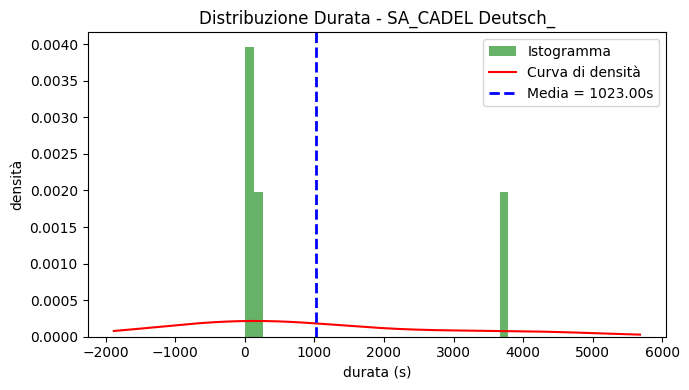

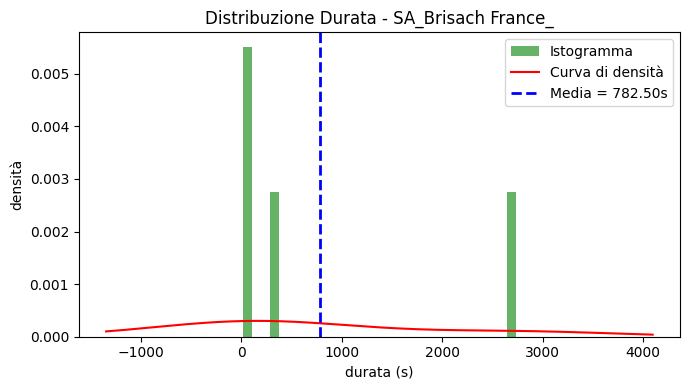

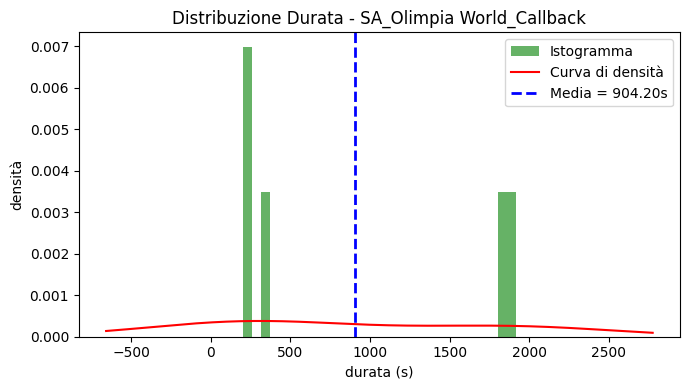

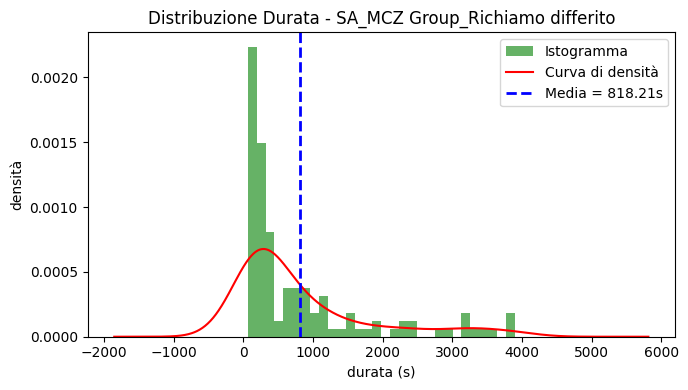

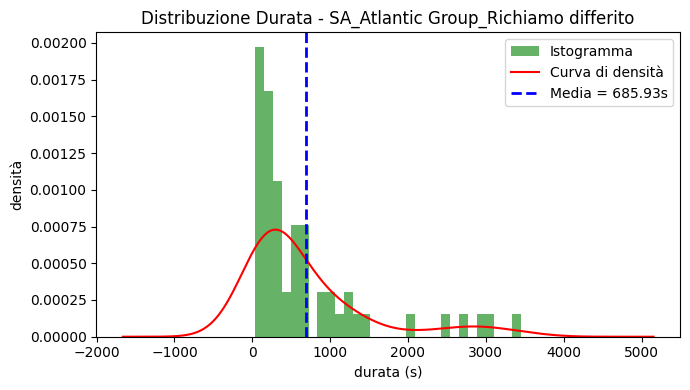

...

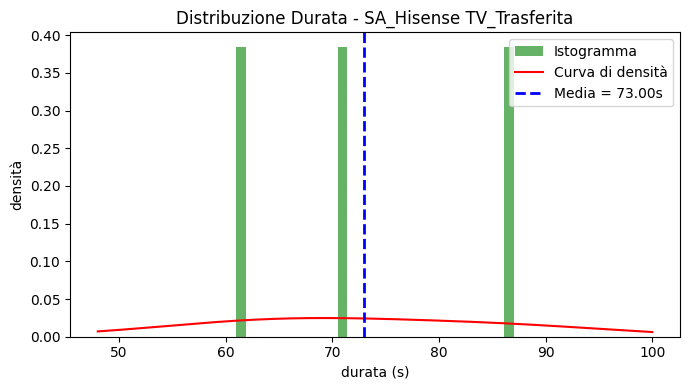

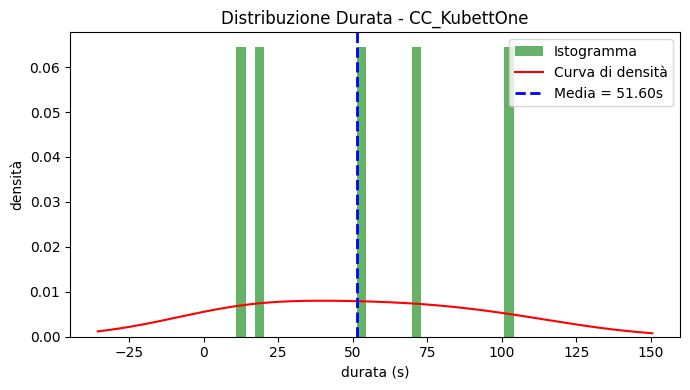

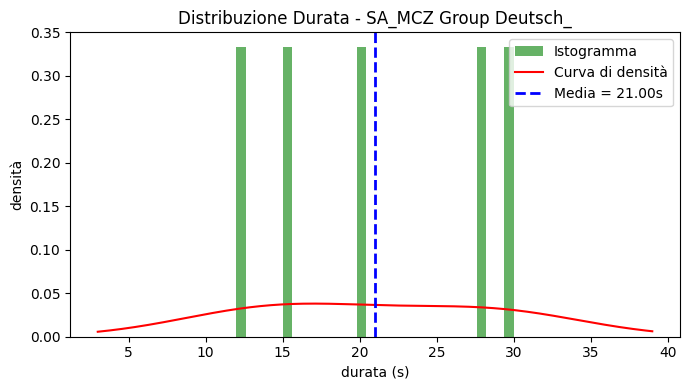

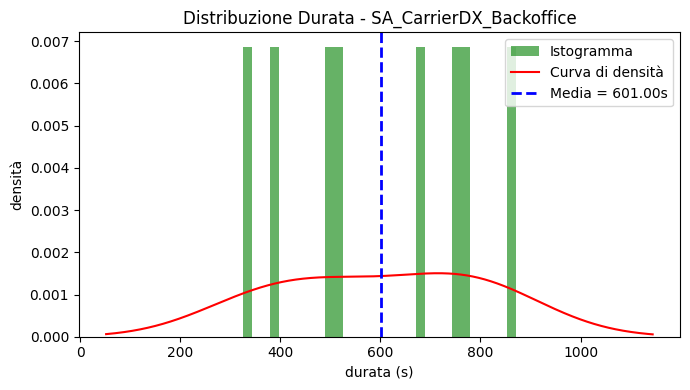

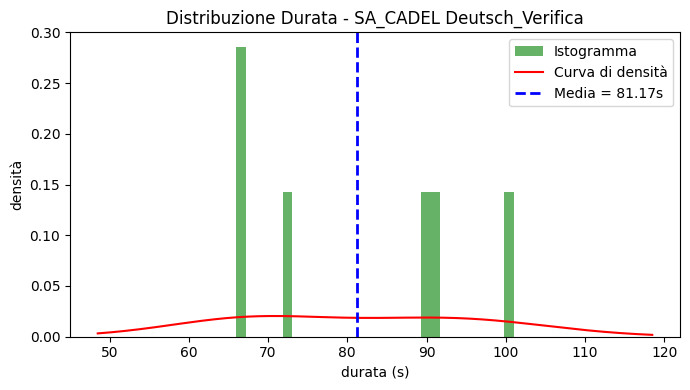

ValueError: `dataset` input should have multiple elements.

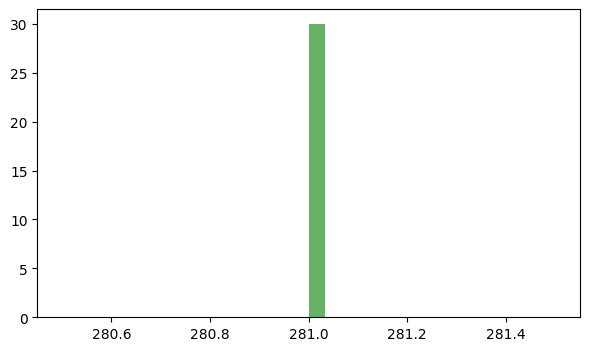

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew

def evaluate_mean_vs_median_and_plot_distributions():
    """
    1) Carica i file 'scarico_annuale_CC.csv' e 'scarico_annuale_SA.csv'.
    2) Unisce in un unico DataFrame (df).
    3) Pulisce la colonna 'durata' e genera la colonna 'unique_id' (se non esiste).
    4) Per ciascun 'unique_id', calcola mean, median e skewness.
    5) Stampa un report sulle differenze mean-median e la skewness.
    6) Visualizza un grafico (istogramma + densità + linea della media)
       della distribuzione di 'durata' per ciascun 'unique_id'.
    """

    # ---------------------------
    # Step A: Caricamento CSV
    # ---------------------------
    df_cc = pd.read_csv('scarico_annuale_CC.csv', parse_dates=['data inizio'])
    df_sa = pd.read_csv('scarico_annuale_SA.csv', parse_dates=['data inizio'])

    # Unisce in un unico DataFrame
    df = pd.concat([df_cc, df_sa], ignore_index=True)

    # ---------------------------
    # Step B: Pulizia minima
    # ---------------------------
    # Converti 'durata' a numerico
    df['durata'] = pd.to_numeric(df['durata'], errors='coerce')
    # Rimuovi NaN e <= 0
    df = df.dropna(subset=['durata'])
    df = df[df['durata'] > 0]

    # Se non esiste 'unique_id', generala da 'rispostacc'
    if 'unique_id' not in df.columns:
        df['unique_id'] = df['rispostacc'].astype(str).str.strip()

    df = df.dropna(subset=['unique_id'])  # remove eventuali righe senza unique_id

    # ---------------------------
    # Step C: Calcolo statistiche
    # ---------------------------
    groups = df.groupby('unique_id')
    report = []

    for uid, group in groups:
        durations = group['durata'].values

        mean_val = durations.mean()
        median_val = np.median(durations)
        skew_val = skew(durations, bias=False)  # asimmetria (bias=False per stima corretta)
        mean_median_diff = abs(mean_val - median_val)

        report.append({
            'unique_id': uid,
            'count': len(durations),
            'mean': mean_val,
            'median': median_val,
            'mean_median_diff': mean_median_diff,
            'skewness': skew_val
        })

    df_report = pd.DataFrame(report)
    df_report = df_report.sort_values('mean_median_diff', ascending=False)
    df_report.to_csv('df_report.csv', index=False)
    # ---------------------------
    # Step D: Stampa i risultati
    # ---------------------------
    print("=== EVALUATION OF MEAN vs MEDIAN FOR TEMPI DI GESTIONE ===")
    print("Se la skewness è alta o la differenza mean/median è elevata, la mediana è più robusta.\n")
    print(df_report.to_string(index=False, float_format=lambda x: f"{x:0.2f}"))

    # ---------------------------
    # Step E: Grafici di distribuzione
    # ---------------------------
    # Avviso: se i unique_id sono tanti, genererà molti plot.
    # Per limitare, potresti filtrare i primi N unique_id in df_report
    unique_ids_to_plot = df_report['unique_id'].tolist()  # Se vuoi tutti
    # Esempio: unique_ids_to_plot = df_report['unique_id'].head(10).tolist()


    for uid in unique_ids_to_plot:
        subdf = df[df['unique_id'] == uid]
        durations = subdf['durata'].values

        mean_val = durations.mean()

        # Crea la figura
        plt.figure(figsize=(7, 4))

        # Istogramma con densità
        plt.hist(durations, bins=30, alpha=0.6, color='g', density=True, label='Istogramma')

        # Curva di densità
        subdf['durata'].plot(kind='density', color='r', label='Curva di densità')

        # Linea verticale della media
        plt.axvline(mean_val, color='blue', linestyle='dashed', linewidth=2,
                    label=f"Media = {mean_val:.2f}s")

        plt.title(f"Distribuzione Durata - {uid}")
        plt.xlabel("durata (s)")
        plt.ylabel("densità")
        plt.legend()
        plt.tight_layout()
        plt.show()



# Esempio di utilizzo:
if __name__ == "__main__":
    evaluate_mean_vs_median_and_plot_distributions()
